# Config

In [37]:
import ee
import folium
import geopandas as gpd
import os
import pyproj
import pycrs
import shapely
import glob
import shutil
import rasterio
import pathlib
import subprocess
from rasterio.plot import show
from google.cloud import storage
import matplotlib.pyplot as plt

In [2]:
ee.Initialize()

In [3]:
# Creating add_ee_layer function
# This allows us to visualise EE objects on a Folium map
def add_ee_layer(self, ee_image_object, vis_params, name):
    map_id_dict = ee_image_object.getMapId(vis_params)
    folium.raster_layers.TileLayer(
        tiles = map_id_dict['tile_fetcher'].url_format,
        attr = 'Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
        name = name,
        overlay = True,
        control = True
    ).add_to(self)

folium.Map.add_ee_layer = add_ee_layer

In [22]:
os.environ["PROJ_IGNORE_CELESTIAL_BODY"] = "YES"

# Solution 1: Rasterise

The easy solution is to rasterise the fault line labels in QGIS and export them as a GeoTIFF.

Given that the underlying imagery are also rasters and will fundamentally have the same projection, they'll overlap (even if they're technically in the wrong place).

In [6]:
# Fault lines rasterised with a resolution of "10000" in QGIS (Raster > Conversion > Rasterize).
faults_raster = ee.Image("projects/esg-satelite/assets/mars/labels/faults_raster/faults_raster_10000")
hrsc_sample_mosaic = ee.Image("projects/esg-satelite/assets/mars/features/hrsc_sample_3/post/hrsc_sample")

In [10]:
Map = folium.Map()

Map.add_ee_layer(
    hrsc_sample_mosaic,
    {},
    "HRSC Sample Mosaic"
)

Map.add_ee_layer(
    # Masking out the 0 values to make them transparent to make things easier to see.
    faults_raster.updateMask(faults_raster.neq(0)),
    {"palette": "red"},
    "Faults Raster"
)

Map

# Solution 2: CRS Correction

The above solution for all intents and purposes works. However it doesn't explain why the offset occurs without rasterisation. This solution aims to shed some light on this.

First let's try plot a small piece of underlying Mars imagery (HRSC) with the fault lines on top. To do this we first need a small section of HRSC.

In QGIS: Raster > Extraction > Clip By Extent

Select a small region by drawing on the map and export the resulting TIFF.

In [11]:
labels = gpd.read_file("gs://esg-satelite-data-warehouse/mars/labels/faults/raw/faults.shp")
hrsc_sample_clipped = rasterio.open("gs://esg-satelite-data-warehouse/mars/features/hrsc_clipped/hrsc_sample_clipped.tif")

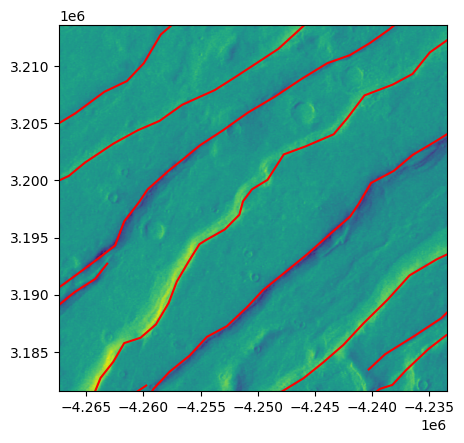

In [15]:
fig, ax = plt.subplots(figsize=(5, 5))
_ = labels.plot(ax=ax, facecolor="none", edgecolor="red")
_ = show(hrsc_sample_clipped, ax=ax)

So far so good. These line up because the TIFF and the fault lines shapefile are both in the same projection.

However, it was at this point I looked more closely at the coordinates. The x-coordinates for example are around -4e6. On QGIS, even when viewing in the EPSG:3857 projection I get exactly the same coordinates as these. Whereas if you were to actually project this to EPSG:3857 you'd get an x-coordinate around -9e6 as you can see below.

In [23]:
labels.to_crs("EPSG:3857").head(1)

,FaultSet,Age,Strike,Length_km,Dip_Dir,Start_X,Start_Y,End_X,End_Y,geometry
0,Set H5,EH,36.316102,39.535,126.316102,-169302.910789,1.148928e+06,-154894.222968,1.168429e+06,"LINESTRING (-8984872.733 4315435.890, -8977419..."


I tried exporting a shapefile by reprojecting it to EPSG:3857 in QGIS with no luck (it remained in Mars Mercator).

This is strange because interestingly, -9e6 is roughly where the eastern seaboard of the US is, which is where Earth Engine plots it. It turns out QGIS was plotting the shapefile (and HRSC) exactly where it should be IF the coordinate system was ALREADY EPSG:3857 - no projection needed.

HYPOTHESIS: Is it possible that everything, including both the shapefile and the underlying Mars imagery is already in EPSG:3857? This might be true if the fault lines have been drawn on an EPSG:3857 canvas but the metadata has been set to the CRS of the Mars imagery.

- Let's try override the CRS with EPSG:3857 without actually transforming the data. The code below does this and writes it to GCP.

In [42]:
gs_processed_path = "gs://esg-satelite-data-warehouse/mars/labels/faults/mercator/faults"
labels_overridden = labels.set_crs("EPSG:3857", allow_override=True)

# Add to local folder "out/"
local_folder = pathlib.Path("out")
local_folder.mkdir(exist_ok=False)
labels_overridden.to_file("out/data.shp") # Note: this will output all the other files too! e.g. .prj


# Move all files from local to Cloud Storage
bucket = gs_processed_path.split("//")[1].split("/")[0]
path_in_bucket = gs_processed_path.split(f"{bucket}/")[1]
for file in glob.glob("out/*"):
    extension = file.split(".")[-1]
    client = storage.Client()
    bucket = client.get_bucket(bucket)
    blob = bucket.blob(f"{path_in_bucket}.{extension}")
    blob.upload_from_filename(f"out/data.{extension}")
shutil.rmtree("out")

Now let's move it to EE.

In [43]:
ee_path = "projects/esg-satelite/assets/mars/labels/faults_mercator/pre/faults_mercator"

result = subprocess.run(
    [
        "earthengine",
        "upload",
        "table",
        f"--asset_id={ee_path}",
        f"{gs_processed_path}.shp"
    ],
    capture_output=True,
    check=True,
)
print(result.stdout.decode())
print(result.stderr.decode())

Started upload task with ID: A4GPF4RBSR7R7MXETP4ITFVD

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/

Now we also need to override the CRS of the TIFF in the same way. If the theory is correct that everything is truly in EPSG:3857 already, then if the TIFF is still in Mars Mercator then Earth Engine is going to project it to the US east coast again.

- In QGIS: Select the layer and right click, then Layer CRS > Set to EPSG:3857.
- Then: Right click the layer and export as a GeoTIFF.

The resulting file was uploaded to GCP. Now we can upload this to EE.

In [44]:
input_path = "gs://esg-satelite-data-warehouse/mars/features/hrsc_clipped/hrsc_sample_clipped_mercator.tif"
ee_path = "projects/esg-satelite/assets/mars/features/hrsc_clipped/hrsc_sample_clipped_mercator"

result = subprocess.run(
    [
        "earthengine",
        "upload",
        "image",
        f"--asset_id={ee_path}",
        input_path
    ],
    capture_output=True,
    check=True,
)
print(result.stdout.decode())
print(result.stderr.decode())

Started upload task with ID: VUYQLTXOROQ7Z33C7XOIGDNV

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/

Finally let's see what the end result is.

In [45]:
hrsc_sample_clipped_mercator = ee.Image("projects/esg-satelite/assets/mars/features/hrsc_clipped/hrsc_sample_clipped_mercator")
faults_mercator = ee.FeatureCollection("projects/esg-satelite/assets/mars/labels/faults_mercator/pre/faults_mercator")

In [46]:
Map = folium.Map()

Map.add_ee_layer(
    hrsc_sample_clipped_mercator,
    {},
    "HRSC Sample"
)

Map.add_ee_layer(
    faults_mercator,
    {"color": "red"},
    "Faults Vector"
)

# We can even add the labels directly from the shapefile to check if EE is messing up the fault lines.
_ = folium.GeoJson(labels_overridden["geometry"]).add_to(Map)

Map

Turns out it looks exactly like it does on QGIS now. It's even in the "right" place on Earth just like on QGIS.

Overall it can't be certain exactly what's going on but my best guess is the following:

- QGIS does not know how to project from Mars Mercator (I keep seeing errors about it) and so it defaults to assuming the source is the 3857 Mercator projection.
- Fault lines were probably drawn on this canvas in this projection.
- These fault lines were given metadata setting the CRS to be the same as the underlying imagery.
- Therefore tools like GeoPandas / EE where we can convert from Mars Mercator are putting them in different places.

The next follow up question is why are they offset? They move sure, but why the offset?

Hard to say exactly but making the assumption that Mars Mercator is just a translation of 3857 is probably incorrect.

- QGIS is showing that the 3857 projection it uses assumes the Earth to have a slight eccentricity: "ELLIPSOID["WGS 84",6378137,298.257223563...]".
- Whereas Mars Mercator assumes a perfect sphere: "ELLIPSOID["Mars_2000_Sphere_IAU_IAG",3396190,0...]"
- There are also some Mars projections that assume Mars to have some eccentricity as well.

These are some factors to consider but in the end, I don't know for sure why the offset is there. All I know is that if you plot all the data with **NO PROJECTION** at all, exactly as is, everything displays fine on a Web Mercator map. I think it's a combination of user error and some weird projection parameters.